# Проект - With Sense
**Основаная цель работы:** сделать демо версию системы search-by-image.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.


### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет, Данила! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Дмитрий, привет! Извини за тот инцидент, было очень сложно тестировать модели (в коллабе было до ~5 часов обучения только линрега), отправляю теперь СВОЙ допиленный проект, нормально протестированный уже на GPU.
</div>

# 1 - Imports & Data (EDA)

In [54]:
import os

import pandas as pd
import numpy as np
from pathlib import Path
import math
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from textwrap import wrap
from PIL import Image

from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()

import re
import random

import warnings
import time
warnings.filterwarnings("ignore")

from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error

from tensorflow.keras.metrics import MeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# 2 импорта для разных версий на пк
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.decomposition import TruncatedSVD

# импортируем также библиотеку nltk, которая содержит в себе корпусы запрещенных слов и лемматизации 
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag
from nltk.corpus import stopwords
from nltk.corpus import wordnet as wn
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')



[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [5]:
# загрузим данные
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip /kaggle/working/dsplus_integrated_project_4.zip -d /kaggle/working/

DATA_PATH = '/kaggle/working/to_upload'

Archive:  /kaggle/working/dsplus_integrated_project_4.zip
   creating: /kaggle/working/to_upload/
   creating: /kaggle/working/to_upload/test_images/
  inflating: /kaggle/working/to_upload/test_images.csv  
  inflating: /kaggle/working/__MACOSX/to_upload/._test_images.csv  
  inflating: /kaggle/working/to_upload/.DS_Store  
  inflating: /kaggle/working/__MACOSX/to_upload/._.DS_Store  
  inflating: /kaggle/working/to_upload/train_dataset.csv  
  inflating: /kaggle/working/__MACOSX/to_upload/._train_dataset.csv  
  inflating: /kaggle/working/to_upload/ExpertAnnotations.tsv  
  inflating: /kaggle/working/__MACOSX/to_upload/._ExpertAnnotations.tsv  
  inflating: /kaggle/working/to_upload/CrowdAnnotations.tsv  
  inflating: /kaggle/working/__MACOSX/to_upload/._CrowdAnnotations.tsv  
   creating: /kaggle/working/to_upload/train_images/
  inflating: /kaggle/working/to_upload/test_queries.csv  
  inflating: /kaggle/working/__MACOSX/to_upload/._test_queries.csv  
  inflating: /kaggle/working/to

In [6]:
# запрещенные слова - добавляем сразу
restricted_terms = [

    'child', 'boy', 'girl', 'baby', 'teen', 'teenager', 'kid', 'infant', 'youngster',
    'kids', 'children', 'boys', 'girls', 'babies', 'teens', 'teenagers',
    'toddler', 'toddlers', 'juvenile', 'juveniles', 'minor', 'minors', 'youth', 'youths',
    'preschooler', 'preschoolers', 'kindergartner', 'kindergartners', 'elementary',
    'tween', 'tweens', 'preteen', 'preteens', 'adolescent', 'adolescents',
    'younglings', 'pupil', 'pupils', 'schoolchild', 'schoolchildren', 'schoolgirl',
    'schoolgirls', 'schoolboy', 'schoolboys', 'tot', 'tots', 'little one', 'little ones',
    'young', 'underage', 'child-like', 'childlike', 'young person', 'young people',
    'kiddo', 'kiddos', 'youngster', 'youngsters', 'childhood', 'kindergarten',
    'nursery', 'playdate', 'playtime', 'playground', 'daycare', 'diapers',
    'crib', 'cradle', 'stroller', 'pacifier', 'playpen'
]

In [7]:
# сразу считываем трейн
train_data = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [8]:
# посмотрим также на кол-во изображений и запросов
print('\n'.join([f"{i} {train_data[i].nunique()}" for i in train_data.columns]))

image 1000
query_id 977
query_text 977


In [9]:
# на всякий случай проверим явно пандасовской командой пропуски
train_data.isna().sum()

image         0
query_id      0
query_text    0
dtype: int64

Итого: крупный датасет на 5822 наблюдений, 1000 уникальных картинок и 977 уникальных текстовых запроса. Данные без пропусков. Теперь смотрим тест датасет

In [10]:
# тест датасет, был странный сепаратор |
test_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), index_col=[0], sep='|')
test_queries.info()
test_queries.head()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [11]:
print('\n'.join([f"{i}  {test_queries[i].nunique()}" for i in test_queries.columns]))

query_id  500
query_text  500
image  100


In [12]:
test_queries.isna().sum()

query_id      0
query_text    0
image         0
dtype: int64

In [13]:
test_queries.isnull().sum()

query_id      0
query_text    0
image         0
dtype: int64

Все ок, соотвествует описанию проекта. Датасет содержит 100 уникальных картинок и 500 уникальных запросов. Теперь подгрузим краудсорс оценки

In [14]:
data_crowd = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'conf_rate', 'confirm', 'not_confirm'])
data_crowd.info()
data_crowd.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   conf_rate    47830 non-null  float64
 3   confirm      47830 non-null  int64  
 4   not_confirm  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,conf_rate,confirm,not_confirm
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [15]:
data_crowd.isna().sum()
data_crowd.isnull().sum()

image          0
query_id       0
conf_rate      0
confirm        0
not_confirm    0
dtype: int64

Здесь тоже все ок, смотрим теперь экспертные оценки

In [16]:
data_expert = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'exp_1', 'exp_2', 'exp_3'])
data_expert.info()
data_expert

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp_1     5822 non-null   int64 
 3   exp_2     5822 non-null   int64 
 4   exp_3     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,exp_1,exp_2,exp_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1


In [17]:
data_expert.isna().sum()
data_expert.isnull().sum()

image       0
query_id    0
exp_1       0
exp_2       0
exp_3       0
dtype: int64

In [18]:
test_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'))
test_images.info()
test_images.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [19]:
test_images.isna().sum()


image    0
dtype: int64

In [20]:
test_images.isnull().sum()

image    0
dtype: int64

Далее более детально поработаем с оценками экспертов. Я сделаю медианную оценку, предварительно поместив оценки в диапозон от 1 до 3, применив простое масштабирование.

In [21]:
data_expert['exp_total'] = data_expert[['exp_1', 'exp_2', 'exp_3']].median(axis=1)
data_expert['exp_norm'] = (data_expert['exp_total'] - data_expert['exp_total'].min()) / (data_expert['exp_total'].max() - data_expert['exp_total'].min())

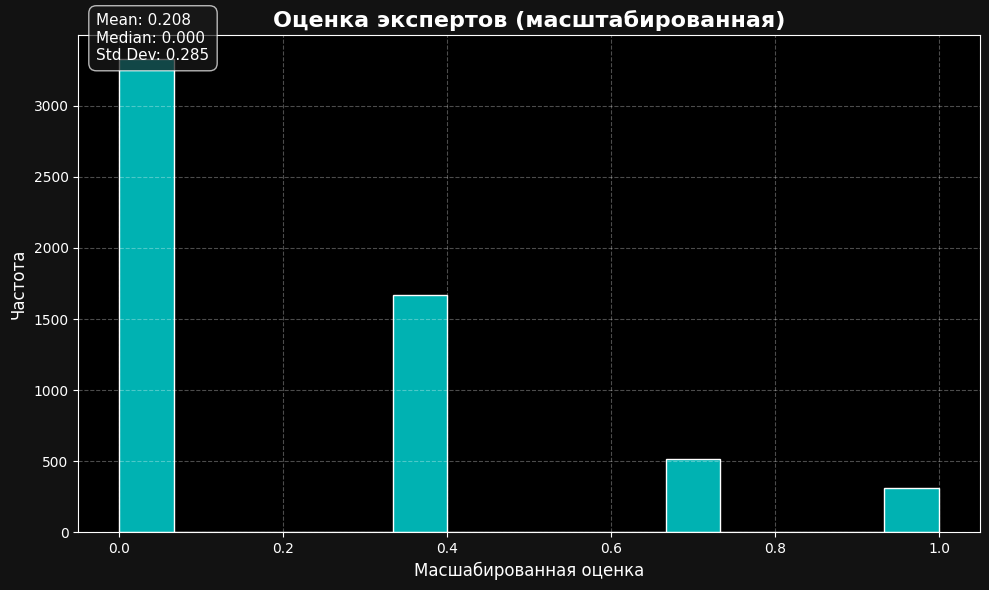

In [22]:
plt.style.use('dark_background')

# масштаб, корзины, сетка
plt.figure(figsize=(10, 6))
ax = sns.histplot(data_expert['exp_norm'], bins=15, color='cyan', alpha=0.7, kde=False)
plt.grid(True, alpha=0.3, linestyle='--')

# подпишем заголовки
plt.title('Оценка экспертов (масштабированная)', fontsize=16, color='white', fontweight='bold')
plt.xlabel('Масшабированная оценка', fontsize=12, color='white')
plt.ylabel('Частота', fontsize=12, color='white')

# добавим плашку со значениями статистик - медианы, среднего и стандартного отклонения
stats_text = f"Mean: {data_expert['exp_norm'].mean():.3f}\nMedian: {data_expert['exp_norm'].median():.3f}\nStd Dev: {data_expert['exp_norm'].std():.3f}"
plt.annotate(stats_text, xy=(0.02, 0.95), xycoords='axes fraction', 
             color='white', fontsize=11, bbox=dict(boxstyle="round,pad=0.5", facecolor='#1A1A1A', alpha=0.7))

gradient = np.linspace(0, 1, 100).reshape(-1, 1)

plt.gcf().patch.set_facecolor('#121212')
plt.tight_layout()
plt.show()

Как можем заметить, большинство экспертов негативно оценивает описания изображений, отмечая, что они не соответствуют тому, что на изображении показано. В целом, уже на этом этапе стоит задуматься о валидности наших данных, поскольку даже если мы будем использовать качественные картинки, то их будет гораздо меньше, что отразится и на этапе обучения модели. Таким образом, в силу того, что проект учебный, мы примем эти допущения, но на реальных данных с этой задачкой следует пойти к команде)

Смержим эти оценки в трейн датасет. Сплодим копию, это для надёжности, чтобы потом было, к чему вернуться

In [23]:
# везде делаем лефт мерж по изображению и его айди
train_data = train_data.merge(
    data_expert[['image', 'query_id', 'exp_norm']], 
    how='left', 
    on=['image', 'query_id']
)

train_data = train_data.merge(
    data_crowd[['image', 'query_id', 'conf_rate']], 
    how='left', 
    on=['image', 'query_id']
)

train_data.head()

,image,query_id,query_text,exp_norm,conf_rate
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,NaN
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333,0.0
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000,1.0
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,NaN


Смержили, все ок

In [25]:
query_id_text_corresp = train_data[['query_id', 'query_text']].drop_duplicates()

train_data = train_data.drop(columns=['query_text']).merge(query_id_text_corresp, how="left", on=['query_id'])

In [26]:
train_data['target'] = train_data[['conf_rate', 'exp_norm']].mean(axis=1)
train_data = train_data.drop(columns=['conf_rate', 'exp_norm'])
train_data.head()

,image,query_id,query_text,target
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.166667
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


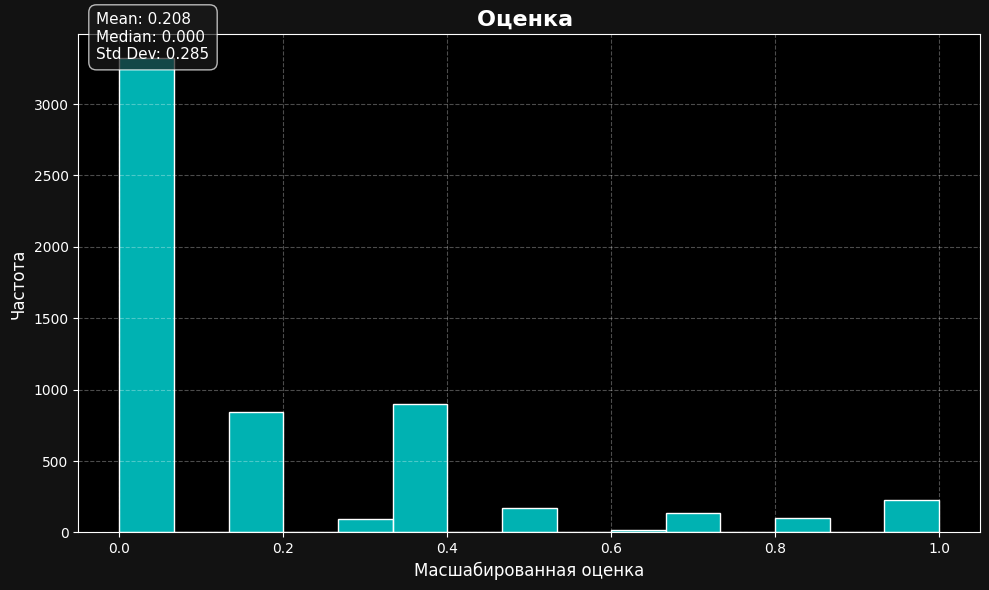

In [27]:
plt.style.use('dark_background')

# масштаб, корзины, сетка
plt.figure(figsize=(10, 6))
ax = sns.histplot(train_data['target'], bins=15, color='cyan', alpha=0.7, kde=False)
plt.grid(True, alpha=0.3, linestyle='--')

# подпишем заголовки
plt.title('Оценка ', fontsize=16, color='white', fontweight='bold')
plt.xlabel('Масшабированная оценка', fontsize=12, color='white')
plt.ylabel('Частота', fontsize=12, color='white')

# добавим плашку со значениями статистик - медианы, среднего и стандартного отклонения
stats_text = f"Mean: {data_expert['exp_norm'].mean():.3f}\nMedian: {data_expert['exp_norm'].median():.3f}\nStd Dev: {data_expert['exp_norm'].std():.3f}"
plt.annotate(stats_text, xy=(0.02, 0.95), xycoords='axes fraction', 
             color='white', fontsize=11, bbox=dict(boxstyle="round,pad=0.5", facecolor='#1A1A1A', alpha=0.7))

gradient = np.linspace(0, 1, 100).reshape(-1, 1)

plt.gcf().patch.set_facecolor('#121212')
plt.tight_layout()
plt.show()

Теперь сделаем визуализацию, которая будет отображать картинки и описания. Визуализацию будем проводить, добавляя также порог классификации и вероятность метки выводимого класса. Сделаем 2 наглядных представления - негативных и позитивных классификаций.

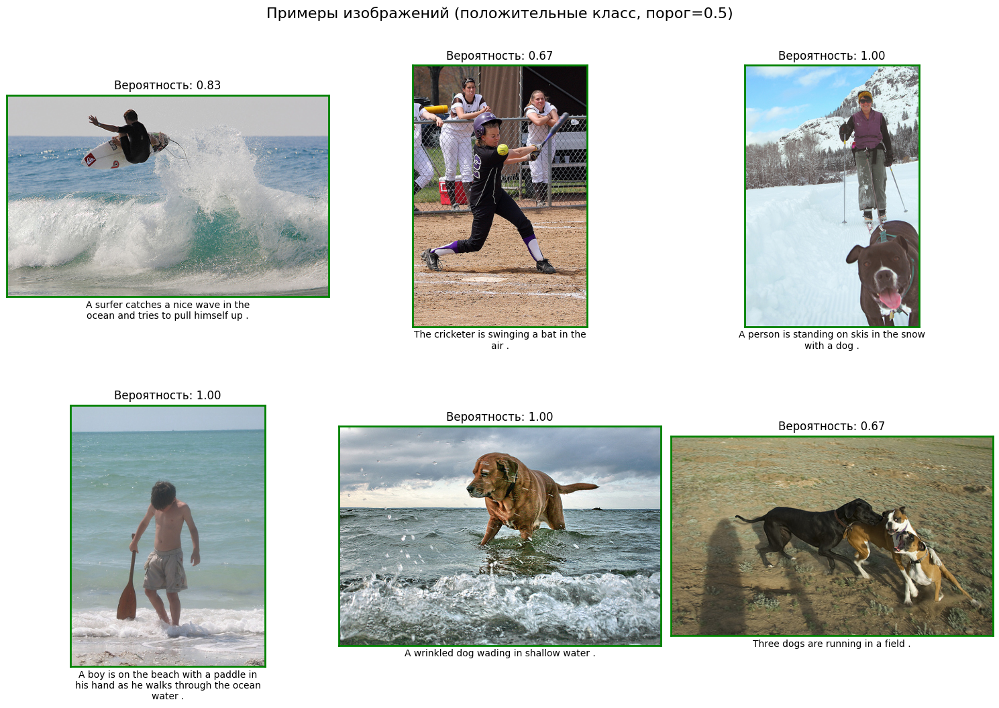

In [ ]:
sample_data = train_data.sample(n=2000, random_state=88)

def visualize_samples(data, n_samples=6, n_rows=2, n_cols=3, figsize=(15, 10), 
                      random_state=None, threshold=0.5, class_filter=None, 
                      title_format="вероятность={:.2f}", show_text=True, text_wrap=40):
    
    # фильтрация данных по классу
    if class_filter == 'positive':
        filtered_data = data[data['target'] > threshold]
    elif class_filter == 'negative':
        filtered_data = data[data['target'] <= threshold]
    else:
        filtered_data = data
    
    if len(filtered_data) > n_samples:
        samples = filtered_data.sample(n=n_samples)
    else:
        samples = filtered_data
        print(f"Предупреждение: Запрошено {n_samples} примеров, но доступно только {len(filtered_data)}")
    
    fig = plt.figure(figsize=figsize, facecolor='white')
    plt.style.use('default')
    
    for i, (_, row) in enumerate(samples.iterrows()):
        if i >= n_rows * n_cols:
            break
            
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        ax.set_facecolor('white')

        # загрузка изображения
        img_name = row['image']
        img_text = row['query_text'] if show_text else ""
        img_target = row['target']
        
        # try/except для отсутствующих изображений
        try:
            img = mpimg.imread(f'{DATA_PATH}/train_images/{img_name}')
            ax.imshow(img)
        except FileNotFoundError:
            ax.text(0.5, 0.5, "Изображение не найдено", ha='center', va='center')
            ax.set_facecolor('lightgray')
        
        ax.set_title(title_format.format(img_target))
        
        if show_text and img_text:
            wrapped_text = '\n'.join(wrap(str(img_text), text_wrap))
            ax.set_xlabel(wrapped_text)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # цветная рамка для наглядности
        if img_target > threshold:
            for spine in ax.spines.values():
                spine.set_edgecolor('green')
                spine.set_linewidth(2)
        else:
            for spine in ax.spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(2)
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.3)
    
    # общий заголовок
    class_str = {
        'positive': 'положительные',
        'negative': 'отрицательные',
        None: 'смешанные'
    }[class_filter]
    
    plt.suptitle(f"Примеры изображений ({class_str} класс, порог={threshold})", 
                 fontsize=16, y=1.05)
    
    return fig

# правильные классификации
fig1 = visualize_samples(
    sample_data, 
    n_samples=6, 
    n_rows=2, 
    n_cols=3,
    figsize=(15, 10),
    random_state=21,
    class_filter='positive',
    title_format="Вероятность: {:.2f}"
)
plt.show()

# неправильные
fig2 = visualize_samples(
    sample_data,
    n_samples=6,
    random_state=88,
    class_filter='negative',
    text_wrap=30
)
plt.show()

Итак, делаем вывод, что по разметке результат +- приемлемый, вероятности классов картинок подобраны правильно в большинстве случаев. Теперь необходимо качественно обработать датасет от данных слов. Напишу реализацию и сделаю две функции - одну для обработки изначальных текстов, чтобы их можно было прогонять через корпус, вторую - для того, чтобы навешивать флаг о том, подходит ли нам это изображение или нет.

In [29]:
# без этой команды может высвечиваться ошибка если пытаться воспроизвести код у себя
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


True

In [30]:
tqdm.pandas()

restricted_terms = [term.lower() for term in restricted_terms]

term_variants = []
for term in restricted_terms:
    if term.endswith('s') and term[:-1] not in restricted_terms:
        term_variants.append(term[:-1])
    elif not term.endswith('s') and term + 's' not in restricted_terms:
        term_variants.append(term + 's')
        
restricted_terms.extend(term_variants)
restricted_terms = list(set(restricted_terms))  # Remove duplicates

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def text_processor(text):
    text = text.lower()
    text = re.sub(r'([a-z])[^a-z]([a-z])', r'\1\2', text)
    text = re.sub(r'([a-z])\.([a-z])', r'\1\2', text)
    char_substitutions = {
        '0': 'o', '1': 'i', '1': 'l', '3': 'e', '4': 'a', 
        '5': 's', '6': 'g', '7': 't', '8': 'b', '9': 'g'
    }
    for num, letter in char_substitutions.items():
        text = text.replace(num, letter)
    
    text = re.sub(r'[^a-z ]', ' ', text)
    
    tokens = nltk.word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    
    pos_mapping = defaultdict(lambda: wn.NOUN)
    pos_mapping['J'] = wn.ADJ
    pos_mapping['V'] = wn.VERB
    pos_mapping['R'] = wn.ADV
    
    tokens = [lemmatizer.lemmatize(word, pos_mapping[tag[0]]) for word, tag in pos_tag(tokens)]
    
    processed_text = ' '.join(tokens)
    
    return processed_text

train_data['processed_text'] = train_data['query_text'].progress_apply(text_processor)
train_data.head()

def content_filter(row):
    processed_phrase = row['processed_text']
    original_text = row['query_text'].lower()
    
    words = processed_phrase.split()
    direct_matches = [word for word in words if word in restricted_terms]
    
    for blocked_term in restricted_terms:
        if len(blocked_term.split()) > 1 and blocked_term in processed_phrase:
            direct_matches.append(blocked_term)
    
    for blocked_term in restricted_terms:
        if blocked_term in original_text:
            direct_matches.append(blocked_term)
    
    compound_matches = []
    for word in words:
        if len(word) > 4:
            for blocked_term in restricted_terms:
                if len(blocked_term) > 3 and blocked_term in word and blocked_term != word:
                    compound_matches.append(blocked_term)
    
    detected_terms = list(set(direct_matches + compound_matches))
    
    if detected_terms:
        row['content_restricted'] = 1
        row['flagged_terms'] = ','.join(detected_terms)
    else:
        row['content_restricted'] = 0
        row['flagged_terms'] = ''
    
    return row

train_data = train_data.progress_apply(content_filter, axis=1)
train_data.head()

restricted_count = train_data['content_restricted'].sum()
total_count = len(train_data)
percentage_restricted = (restricted_count / total_count) * 100

print(f"Всего описаний: {total_count}")
print(f"Описания с ограничениями: {restricted_count}")
print(f"% описаний с ограничениями от общей выборки: {percentage_restricted:.2f}%")

if 'flagged_terms' in train_data.columns:
    all_flagged_terms = []
    for terms in train_data['flagged_terms'].dropna():
        if terms:
            all_flagged_terms.extend(terms.split(','))
    
    term_frequency = pd.Series(all_flagged_terms).value_counts()
    
    print("\nТоп 15 слов-ограничений:")
    print(term_frequency.head(15))


print(f"Размер датасета до изменений: {len(train_data)}")
filtered_dataset = train_data.loc[train_data['content_restricted'] == 0]
print(f"Размер датасета после изменений: {len(filtered_dataset)}")

100%|██████████| 5822/5822 [00:04<00:00, 1288.28it/s]

Всего описаний: 5822
Описания с ограничениями: 1684
% описаний с ограничениями от общей выборки: 28.92%

Топ 15 слов-ограничений:
boy           580
girl          561
young         380
child         349
girls         171
boys          144
children      106
kid           101
baby           61
kids           56
playground     54
toddler        47
childs         40
tween          23
childrens      20
Name: count, dtype: int64
Размер датасета до изменений: 5822
Размер датасета после изменений: 4138


В целом, описание наглядное, видим, что достаточно много слов попали под ограничение, перед тем, как их убирать, посмотрим сэмпл данных картинок, чтобы убедиться, что мы сделали все правильно

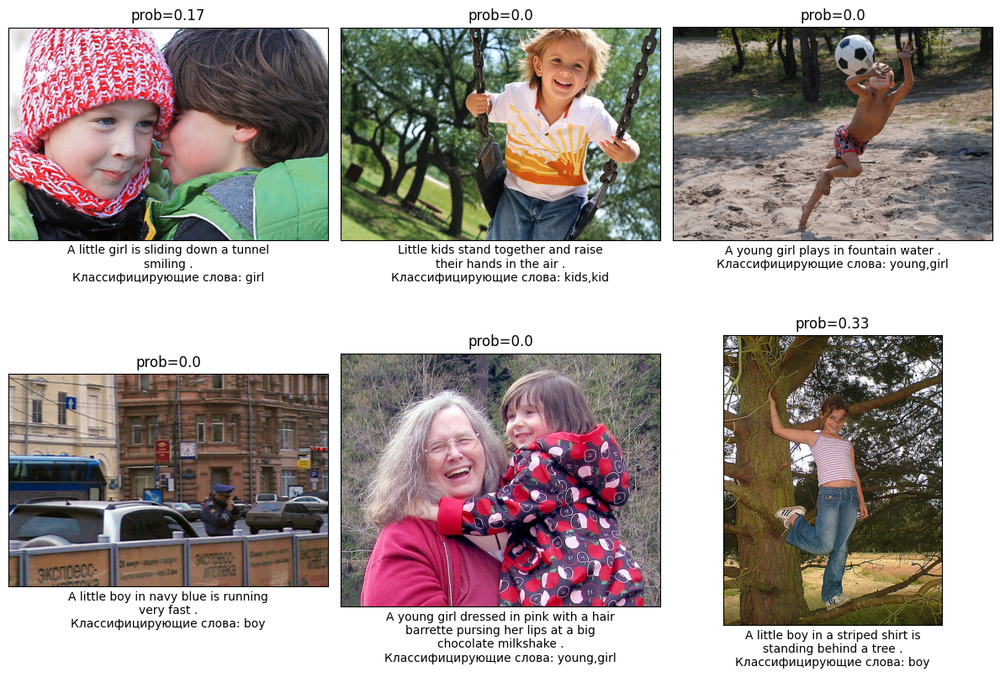

In [35]:
sample_dataset = train_data.sample(n=2000, random_state=88)
restricted_samples = sample_dataset[sample_dataset['content_restricted'] == 1]

fig = plt.figure(figsize=(12, 12))
for i in range(min(6, len(restricted_samples))):
    fig.add_subplot(3, 3, i+1)
    img_name = restricted_samples.iloc[i]['image']
    img_text = restricted_samples.iloc[i]['query_text']
    img_text = '\n'.join(wrap(str(img_text), 40))
    
    img_target = restricted_samples.iloc[i]['target']
    flagged = restricted_samples.iloc[i]['flagged_terms']
    
    img = mpimg.imread(f'{DATA_PATH}/train_images/{img_name}')
    plt.imshow(img)
    plt.title(f'prob={round(img_target, 2)}')
    plt.xlabel(f"{img_text}\nКлассифицирующие слова: {flagged}")
    plt.xticks([])
    plt.yticks([])
    
plt.tight_layout()
plt.show()

В целом, алгоритм отрабатывает довольно неплохо. Лишь изредка можно увидеть нерелевантные картинки если выводить семплы. Тогда применим его на датасет

In [36]:
# размер до
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               5822 non-null   object 
 1   query_id            5822 non-null   object 
 2   query_text          5822 non-null   object 
 3   target              5822 non-null   float64
 4   processed_text      5822 non-null   object 
 5   content_restricted  5822 non-null   int64  
 6   flagged_terms       5822 non-null   object 
dtypes: float64(1), int64(1), object(5)
memory usage: 318.5+ KB


In [37]:
filtered_dataset = train_data.loc[train_data['content_restricted'] == 0]
train_data = filtered_dataset

In [38]:
# размер после
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4138 entries, 22 to 5821
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               4138 non-null   object 
 1   query_id            4138 non-null   object 
 2   query_text          4138 non-null   object 
 3   target              4138 non-null   float64
 4   processed_text      4138 non-null   object 
 5   content_restricted  4138 non-null   int64  
 6   flagged_terms       4138 non-null   object 
dtypes: float64(1), int64(1), object(5)
memory usage: 258.6+ KB


In [39]:
# уберем ненужные промежуточные колонки-флаги, которые ставили в df, чтобы отслеживать корректность и посчитать тотал количество удаляемых итемов
train_data = train_data[['image', 'query_id', 'query_text', 'target', 'processed_text']]
train_data = train_data.rename(columns={'processed_text': 'preproc'})
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4138 entries, 22 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4138 non-null   object 
 1   query_id    4138 non-null   object 
 2   query_text  4138 non-null   object 
 3   target      4138 non-null   float64
 4   preproc     4138 non-null   object 
dtypes: float64(1), object(4)
memory usage: 194.0+ KB


Теперь займемся векторизацией. Сначала для изображений, потом для текста, потом объединим векторы

In [40]:
def create_embedding_model():
    backbone = ResNet50(input_shape=(224, 224, 3),
                        include_top=False,
                        weights='imagenet')
    
    for layer in backbone.layers:
        layer.trainable = False
    
    x = GlobalAveragePooling2D()(backbone.output)
    x = Dense(512, activation='relu')(x)
    
    model = Model(inputs=backbone.input, outputs=x)
    
    return model

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

train_gen_flow = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory=Path(DATA_PATH, 'train_images'),
    x_col='image',
    y_col=None,  # не загружаем метки, так как нам нужны только признаки
    target_size=(224, 224),
    batch_size=32,
    class_mode=None,
    shuffle=False,
    seed=88)

embedding_model = create_embedding_model()

image_embeddings = embedding_model.predict(train_gen_flow, 
                                         steps=len(train_gen_flow),
                                         verbose=1)

Found 4138 validated image filenames.


I0000 00:00:1744902518.544278      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


I0000 00:00:1744902527.607387     101 service.cc:148] XLA service 0x7bb9e4002ba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744902527.608388     101 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1744902528.296239     101 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/130 ━━━━━━━━━━━━━━━━━━━━ 14:32 7s/step

I0000 00:00:1744902531.502685     101 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


130/130 ━━━━━━━━━━━━━━━━━━━━ 59s 405ms/step


In [41]:
image_embeddings.shape

(4138, 512)

Зафиксировали размерность. Теперь векторизуем текст

In [43]:
tfidf = TfidfVectorizer(max_features=10000, ngram_range=(1, 2))
tfidf_train_data = tfidf.fit_transform(train_data['preproc'])

svd = TruncatedSVD(n_components=300, random_state=88)
text_embeddings = svd.fit_transform(tfidf_train_data)

In [44]:
text_embeddings.shape

(4138, 300)

Размерности совпадают, может объединять

In [45]:
scaler = StandardScaler()
image_embeddings_scaled = scaler.fit_transform(image_embeddings)
text_embeddings_scaled = scaler.fit_transform(text_embeddings)

features = np.concatenate((image_embeddings_scaled, text_embeddings_scaled), axis=1)

target = np.array(train_data['target'])

In [46]:
target.shape

(4138,)

# 2 - Models

Сразу стоит оговориться, что будем использовать MSE как лосс для оценки моделей.

Для избежания переобучения применим GroupShuffleSplit на моменте деления на трейн-тест

In [47]:
groups = train_data['image']

gss = GroupShuffleSplit(n_splits=1, train_size=.6, random_state=88)
train_ind, test_ind = next(gss.split(X=features, y=target, groups=groups))

features_train, features_test = features[train_ind], features[test_ind]
target_train, target_test = target[train_ind], target[test_ind]

In [48]:
print(features_train.shape, features_test.shape, target_train.shape, target_test.shape)

(2514, 812) (1624, 812) (2514,) (1624,)


По размерностям все ок

In [49]:
scaler = StandardScaler()
scaler.fit(features_train)
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

Пусть бейзлайн будет регрессия с L2

In [51]:
model_r = Ridge().fit(features_train, target_train)
predictions_r = model_r.predict(features_test)
mse = mean_squared_error(target_test, predictions_r)
mse

0.10003685137711599

Также обычная линейная регрессия

In [52]:
model_lr = LinearRegression().fit(features_train, target_train)
predictions_lr = model_lr.predict(features_test)
mse_lr = mean_squared_error(target_test, predictions_lr)
mse_lr

0.10041890614056853

Теперь сделаем нейросеть. Постараюсь оптимизировать из-за небольшой мощности пк

In [57]:
model_nn = Sequential([
    Dense(1024, activation='relu', input_shape=(812,)),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(768, activation='relu'),
    BatchNormalization(),
    Dropout(0.25),
    
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    
    Dense(256, activation='relu'),
    BatchNormalization(),
    
    Dense(128, activation='relu'),
    BatchNormalization(),
    
    Dense(64, activation='relu'),
    
    Dense(1, activation='linear')
])

model_nn.compile(
    loss='mean_squared_error',
    optimizer=Adam(learning_rate=0.0001),
    metrics=[MeanSquaredError()]
)

history = model_nn.fit(
    features_train,
    target_train,
    epochs=100,  
    batch_size=64,
    validation_data=(features_test, target_test),
    verbose=1
)

Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.6862 - mean_squared_error: 0.6862 - val_loss: 0.1445 - val_mean_squared_error: 0.1445
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4674 - mean_squared_error: 0.4674 - val_loss: 0.1569 - val_mean_squared_error: 0.1569
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3523 - mean_squared_error: 0.3523 - val_loss: 0.1648 - val_mean_squared_error: 0.1648
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3373 - mean_squared_error: 0.3373 - val_loss: 0.1598 - val_mean_squared_error: 0.1598
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3022 - mean_squared_error: 0.3022 - val_loss: 0.1483 - val_mean_squared_error: 0.1483
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2737 - mean_squared_error: 0.2737 - val_loss: 0.1633 - val_mean_squared_error: 0.1633
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2405 - mean_squared_error: 0.2405 - val_loss: 0.1515 - 

Итого - лосс на примерно 70% меньше у нейросети, причем всего на 100 эпохах, что не совсем много для нейросетей, если смотреть в сравнении. + у нас была гораздо более простая нейронка тоже сравнительно)

Found 100 validated image filenames.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step 

A dog is dressed in a shirt and pants on the side of the road .



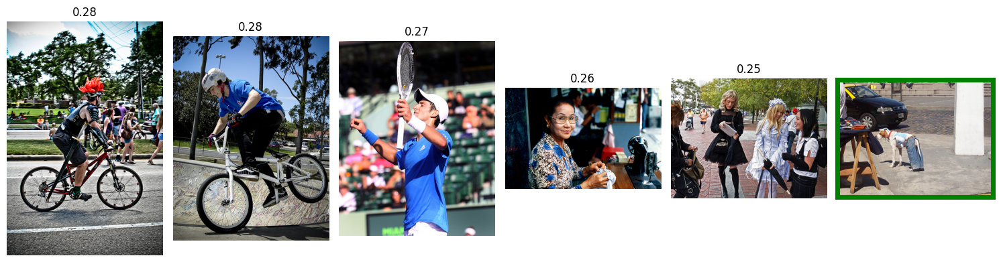

----------------------------------------------------------------------------------------------------

a boxer punches a boxer in the face .



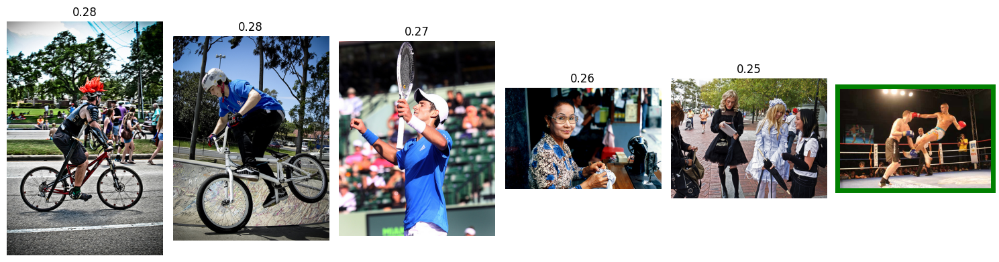

----------------------------------------------------------------------------------------------------

A black and white dog biting onto a chunk of ice .



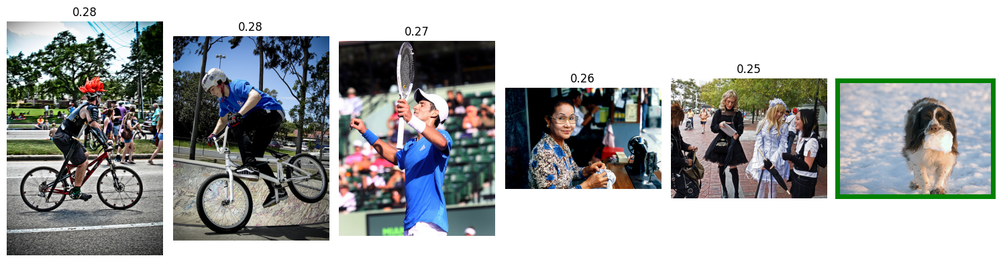

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

The young girl is cross-country skiing .

THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS


A man with a black shirt that says " Genetic Freak " is sleeping on a bus .



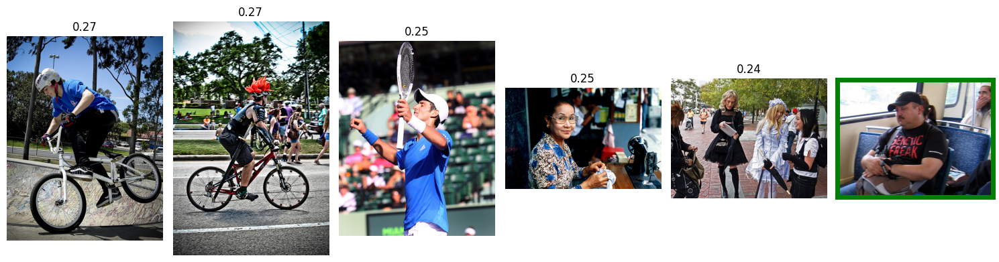

----------------------------------------------------------------------------------------------------

People browse in a store .



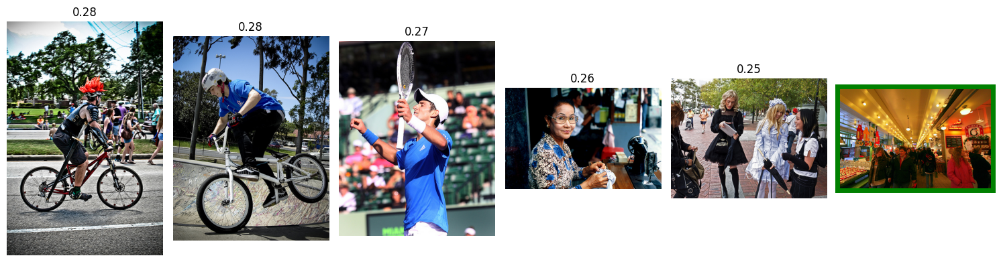

----------------------------------------------------------------------------------------------------

two black dogs playing fetch with a red toy



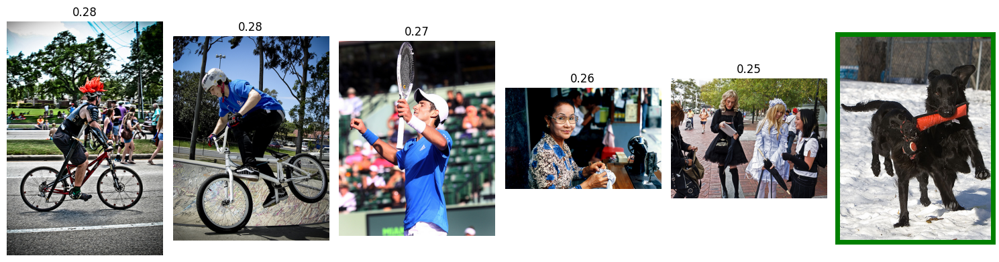

----------------------------------------------------------------------------------------------------

A brown and white dog is carrying a snowball .



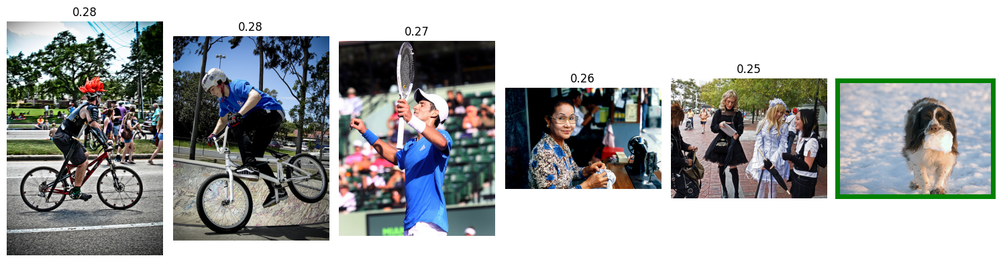

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

A child in a fuzzy blue hat on a tricycle .

THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS

----------------------------------------------------------------------------------------------------

An Afican American woman standing behind two small African American children .

THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS



In [69]:
# Подготовка модели
test_datagen = ImageDataGenerator(rescale=1./255)
test_gen_flow = test_datagen.flow_from_dataframe(
    dataframe=test_images,
    directory=Path(DATA_PATH, 'test_images'),
    x_col='image',
    y_col=None,  
    target_size=(224, 224),
    batch_size=32,
    class_mode=None,
    shuffle=False, 
    seed=88)

# Извлекаем текст и эмбеддинги
test_image_embeddings = embedding_model.predict(
    test_gen_flow,
    steps=len(test_gen_flow),
    verbose=1
)

def inference(text, top_n=5):
    processed_text = text_processor(text)
    
    # проверка на ограничения
    row = {'processed_text': processed_text, 'query_text': text}
    result = content_filter(row)
    
    if result['content_restricted'] == 1:
        print('-'*100)
        print()
        print(text)
        print()
        s = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(s)
        print()
        return None
    
    text_vec = tfidf.transform([processed_text])
    text_emb = svd.transform(text_vec)
    
    num_images = len(test_images)
    text_embeddings_repeated = np.repeat(text_emb, num_images, axis=0)
    combined_features = np.concatenate((test_image_embeddings, text_embeddings_repeated), axis=1)
    scaled_features = scaler.transform(combined_features)
    predictions = model_nn.predict(scaled_features, verbose=0)
    
    results_df = pd.DataFrame({
        'image': test_images['image'],
        'score': predictions.flatten()
    })
    
    top_results = results_df.sort_values('score', ascending=False).head(top_n)
    print()
    print(text)
    print()
    
    fig = plt.figure(figsize=(15, 6))
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0
    
    for i, (_, row) in enumerate(top_results.iterrows()):
        fig.add_subplot(1, top_n+1, i+1, title=round(row['score'], 2))
        image = Image.open(Path(DATA_PATH, 'test_images', row['image']))
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
    
    matching_query = test_queries[test_queries['query_text'] == text]
    if len(matching_query) > 0:
        plt.rcParams['axes.edgecolor'] = 'green'
        plt.rcParams['axes.linewidth'] = 5
        fig.add_subplot(1, top_n+1, top_n+1)
        target_img = matching_query.iloc[0]['image']
        image = Image.open(Path(DATA_PATH, 'test_images', target_img))
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
    
    plt.tight_layout()
    plt.show()
    print('-'*100)
    
    return None

test_phrases = list(test_queries['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)

# 3 - Conclusion

Проект "With Sense" был направлен на создание демонстрационной версии системы поиска изображений по текстовому запросу. Основная цель заключалась в обучении модели, которая может сопоставлять изображения и текстовые описания, выдавая оценку от 0 до 1, отражающую степень их соответствия. В целом, удалось успешно с ним справиться. Для изображений использовалась предобученная модель ResNet50 для извлечения векторных представлений.
Текстовые описания были векторизованы с помощью TF-IDF и уменьшены до 300 компонент с помощью SVD. Для предсказания соответствия изображений и текстов были протестированы несколько моделей, включая линейную регрессию и нейронные сети.
Нейронная сеть показала наилучшие результаты с MSE, значительно ниже, чем у линейных моделей. Также было проведено обучение на тесте, где метрика показала себя чуть хуже, но зато нашла все соответствующие изображения.

Конечно, скорее всего, пришлось бы больше внимания уделить EDA, если бы мы работали с реальными данными (пример - распределение оценок экспертов), но это, скорее, качественная задача, технически проект был реализован.

